# Grupo 14

* Mario Campos Vicente


* Gonzalo Lardiés Guillén


* Adrián Sequera Robledo

### 2-) Implementación de un algoritmo de registro 
En este ejercicio implementaremos un algoritmo de registro rígido (traslación y rotación) en python.

En primer lugar importamos los módulos necesarios:

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pydicom
from scipy.optimize import minimize 

Realizamos una función que nos permita representar varias imágenes simultáneamente. Así podremos ver de manera conjunta la **imagen estándar** y la **imagen médica** así como también las imágenes desplazas y el registro.

In [2]:
def plot_imagenes(names, *imagen):
    num_img = len(imagen) # Cantidad de imagenes introducidas
    plt.figure(figsize = (10*num_img, 5))
    for subplot in range(num_img):
        name = names[subplot] # Nombre de la imagen
        plt.subplot(100 + num_img * 10 + subplot + 1);plt.imshow(imagen[subplot], cmap = "gray");plt.title(name) # Cada imagen se añade a un subplot con su título
        subplot += 1
    plt.show()

Mostramos en pantalla la imagen éstandar y la médica:

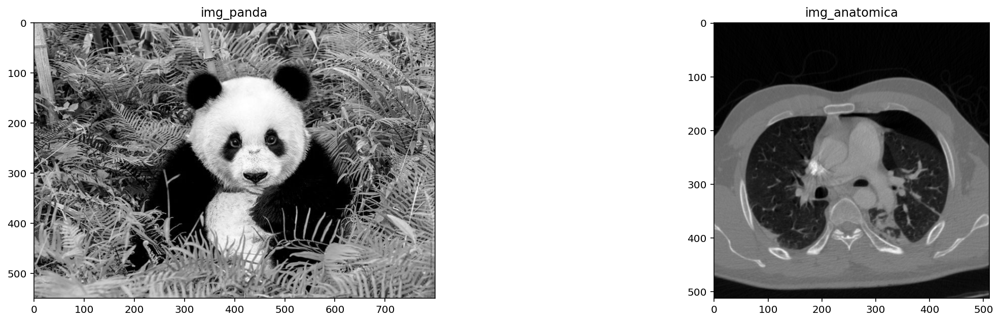

In [3]:
img_panda = cv2.imread('Oso-panda-1.jpg',0)
img_anatomica = pydicom.dcmread("D0120.dcm",force=True)
img_anatomica = img_anatomica.pixel_array
plot_imagenes(["img_panda", "img_anatomica"], img_panda, img_anatomica)

A continuación creamos dos funciones: **rigid_transf** y **rigid_transf_2**. En la primera se harán las modificaciones de traslación y rotación para lograr una imagen desplazada distinta a la original, mientras que en la segunda se hará el proceso inverso para hacer un registro de manera manual y saber cómo deberá hacer el registro la función que se explicará posteriormente. Estas dos funciones se diferencian únicamente en el orden en el que se aplica la traslación y la rotación ya que al cambiar la imagen original se hace en primer lugar traslación con posterior rotación pero para devolverla a su estado original se hará el proceso inverso, primero rotación y después traslación, proceso realizado en **rigid_transf_2** ya que si no no se consigue un correcto registro. Esta segunda función la utilizaremos también para aplicarla a la original con los mejores parámetros que nos proporcionen las siguientes funciones.

In [4]:
def rigid_transf(img,params):
    Ax, Ay, alpha = params
    rows,cols = img.shape
    M = np.float32([[1,0,Ax],[0,1,Ay]])
    img_translated = cv2.warpAffine(img,M,(cols,rows))
    M = cv2.getRotationMatrix2D((cols/2,rows/2),alpha,1)
    img_transformed = cv2.warpAffine(img_translated,M,(cols,rows))
    return img_transformed

In [5]:
def rigid_transf_2(img,params):
    Ax, Ay, alpha = params
    rows,cols = img.shape
    M = cv2.getRotationMatrix2D((cols/2,rows/2),alpha,1)
    img_rotated = cv2.warpAffine(img,M,(cols,rows))
    M = np.float32([[1,0,Ax],[0,1,Ay]])
    img_transformed = cv2.warpAffine(img_rotated,M,(cols,rows))
    
    return img_transformed

A continuación se pueden observar las imágenes desplazadas y rotadas con la primera función:

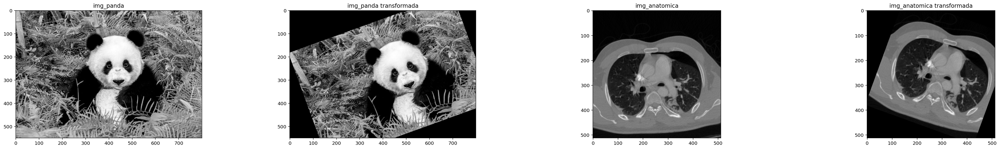

In [6]:
img_panda_transformada = rigid_transf(img_panda,[50,50,20])
img_anatomica_transformada = rigid_transf(img_anatomica,[50,-50,-20])
plot_imagenes(["img_panda", "img_panda transformada", "img_anatomica", "img_anatomica transformada"], img_panda, img_panda_transformada, img_anatomica, img_anatomica_transformada)

A continuación se pueden observar las imágenes con el registro realizado con la segunda función:

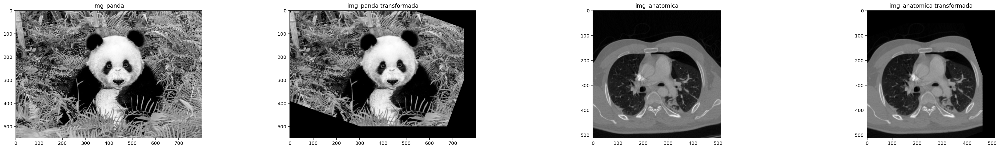

In [7]:
plot_imagenes(["img_panda", "img_panda transformada", "img_anatomica", "img_anatomica transformada"], img_panda, rigid_transf_2(img_panda_transformada,[-50,-50,-20]), img_anatomica, rigid_transf_2(img_anatomica_transformada,[-50,50,20]))

Restamos las imágenes para ver si el registro se ha realizado correctamente:

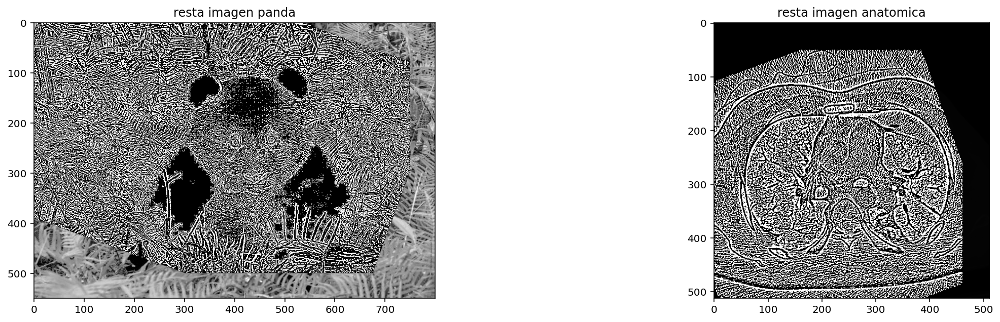

In [8]:
plot_imagenes(["resta imagen panda", "resta imagen anatomica"], img_panda - rigid_transf_2(img_panda_transformada,[-50,-50,-20]), img_anatomica - rigid_transf_2(img_anatomica_transformada,[-50,50,20]))

Tras saber cómo debe salir el registro, hemos realizado las funciones siguiendo el esquema del enunciado. La idea de la función register_func es realizar un histograma 2d en cuyos ejes se encuentran los bins de la imagen original en uno de ellos y los bins de la imagen transformada en el otro eje.
Teniendo el histograma se puede calcular la Pinformación mutua entre ambas imágenes y así poder obtener en la siguiente función la transformación que mayor información mutua proporcione entre las imágenes.

In [9]:
# Ref: https://matthew-brett.github.io/teaching/mutual_information.html
def register_func(params,imagenes):
    img_orig, img_transf = imagenes
    img_transformada = rigid_transf_2(img_transf, params)

    hist_2d, x_edges, y_edges = np.histogram2d(
    img_orig.ravel(),
    img_transformada.ravel(),
    bins=20)
    pxy = hist_2d / float(np.sum(hist_2d)) #Probabilidad conjunta
    px = np.sum(pxy, axis=1) #Probabilidad marginal 
    py = np.sum(pxy, axis=0) #Probabilidad marginal
    px_py = px[:, None] * py[None, :] #Multiplicacion de las marginales 
  
    nzs = pxy > 0 # Solamente los valores no nulos de pxy contribuyen a la suma
    return 1/(np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs])))

Tras tener la inversa de la información mutua, la siguiente función probará diferentes parámetros para el correcto registro e irá obteniendo distintas informaciones mutuas. Finalmente hallará el mínimo de la función register_func, es decir el mínimo de la inversa de la información mutua y por tanto el máximo de ésta obteniendo así los parámetros para rotación y traslación más adecuados para el registro entre las imágenes.

In [10]:
def registro_params(args, x0 = [0,0,0], method = "Powell"):
    parametros = minimize(register_func,x0, args = args, method = "Powell")
    return parametros.x

Se obtienen los parámetros que maximizan la información mutua y se imprimen en pantalla:

In [11]:
registro_panda = registro_params(args = [img_panda, img_panda_transformada])
print(registro_panda)
registro_anatomica = registro_params(args = [img_anatomica, img_anatomica_transformada])
print(registro_anatomica)

[-50.00303947 -50.00591538 -19.99992509]


[-50.00265738  49.99419161  20.00290917]


Realizamos la transformación mediante rigid_transf_2 con los parámetros obtenidos con las funciones register_func y registro_params tanto para la imagen del oso panda como para la anatómica.

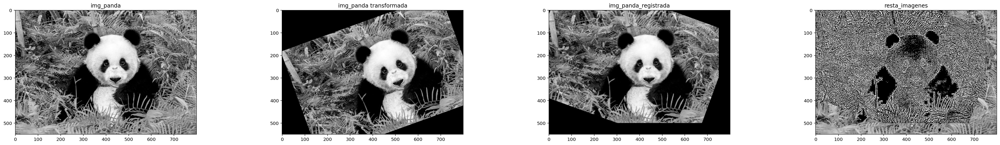

In [12]:
plot_imagenes(["img_panda", "img_panda transformada", "img_panda_registrada", "resta_imagenes"], img_panda, img_panda_transformada, rigid_transf_2(img_panda_transformada,registro_panda), img_panda - rigid_transf_2(img_panda_transformada,registro_panda))

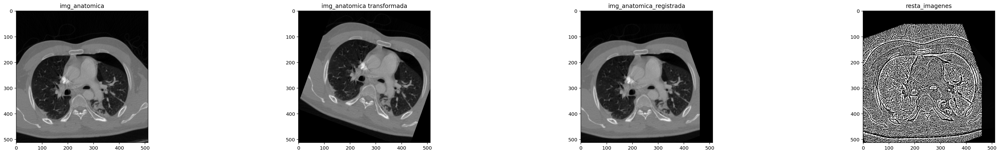

In [13]:
plot_imagenes(["img_anatomica", "img_anatomica transformada", "img_anatomica_registrada", "resta_imagenes"], img_anatomica, img_anatomica_transformada, rigid_transf_2(img_anatomica_transformada,registro_anatomica), img_anatomica - rigid_transf_2(img_anatomica_transformada,registro_anatomica))

## Interpretación de resultados

Se puede observar que el resultado del registro es muy satisfactorio excepto por la eliminación de algunos bordes. En las imágenes de resta también se puede ver que no se quedan completamente negras, esto es debido a que al realizar rotación la interpolación que se hace posteriormente no se ajusta exactamente a la imagen original.